https://github.com/AACuellar00/ML-1-FP

This project is about classification type learning and will be perfomed on CBC data for the purpose of learning how to classify into one of several categories comprising of either healthy or one of several types of anemia.
Multiple types of classification algorithms are used for comparison purposes such as LGBMClassifier, SVC, and Logistic Regression.
I chose this topic because anemia isn't that rare of a condition so I though it'd be interesting to see how ML would assist in identifying and classifying those suffering from one of the types of it. It was also interesting to learn more about anemia in general.

Data is from this kaggle dataset. 
Aboelnaga, E. (2024, May). Anemia Types Classification, Version 1. Retrieved May 18, 20245 from https://www.kaggle.com/datasets/ehababoelnaga/anemia-types-classification/data

In [2]:
%pip install seaborn

In [3]:
import scipy as sp
import scipy.stats as stats
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import copy 
from sklearn.preprocessing import StandardScaler, LabelEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split,StratifiedKFold 
from sklearn.experimental import enable_halving_search_cv 
from sklearn.model_selection import GridSearchCV,HalvingGridSearchCV
from sklearn.model_selection import StratifiedKFold, cross_validate,cross_val_score,cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import make_scorer, f1_score

sns.set()
import statsmodels.formula.api as smf
import statsmodels.api as sm

from sklearn.linear_model import LogisticRegression

from sklearn import datasets, linear_model, metrics
from sklearn.datasets import make_regression

from sklearn.tree import DecisionTreeClassifier

from sklearn.svm import LinearSVC,SVC
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb

import lightgbm as lgb
from lightgbm import LGBMClassifier
from lightgbm import log_evaluation

from sklearn.inspection import permutation_importance

from sklearn.pipeline import Pipeline,make_pipeline

from sklearn.compose import ColumnTransformer

from sklearn.impute import KNNImputer


from sklearn.preprocessing import FunctionTransformer

%matplotlib inline

In [4]:
from pathlib import Path
import os
#(os.listdir())
#print(Path.cwd())

The data is 22 kB and consists of 1281 samples of data collected from several CBC(Complete Blood Count) that had anemia diagnosed manually.There are 15 columns, and besides the categorical diagnosis all of the data is numeric. 
The 14 numerical features consists of:

WBC(White Blood Cell Count): The white blood cell count.

LYMp(Lymphocyte Percentage): Percentage of lymphocytes in the total white blood cell count.

NEUTp(Neutrophil Percentage):Percentage of neutrophil in the total white blood cell count.

LYMn(Lymphocyte Count): Number of lymphocytes in a given volume of blood.

NEUTn(Neutrophil Count): Number of neutrophils in a given volume of blood.

RBC(Red Blood Cell Count): The red blood cell count.

HGB(Hemoglobin): The hemoglobin count.

HCT(Hematocrit): Percentage of a given blood volume occupied by red blood cells.

MCV(Mean Corpuscular Volume): The average volume of one red blood cell.

MCH(Mean Corpuscular Hemoglobin): The average hemoglobin amount per blood cell.

MCHC(Mean Corpuscular Hemoglobin Concentration): The average concentration of hemoglobin in a given volume of red blood cells.

PLT(Platelet Count): The platelet count.

PDW(PLatelet Distribution Width): A measurement of platelet size variability in the blood.

PCT(Platelet Crit): Volume occupied by platelets in the blood

In [74]:
# If there were any missing values this would fill them in with a 'NA' to mark them.
cbc_db = pd.read_csv('kaggle/diagnosed_cbc_data_v4.csv', na_values=pd.NA)
db_features =cbc_db.select_dtypes(include = ['int', 'float']).columns.to_list()
print(cbc_db)

        WBC    LYMp   NEUTp     LYMn    NEUTn   RBC   HGB       HCT   MCV  \
0     10.00  43.200  50.100  4.30000  5.00000  2.77   7.3   24.2000  87.7   
1     10.00  42.400  52.300  4.20000  5.30000  2.84   7.3   25.0000  88.2   
2      7.20  30.700  60.700  2.20000  4.40000  3.97   9.0   30.5000  77.0   
3      6.00  30.200  63.500  1.80000  3.80000  4.22   3.8   32.8000  77.9   
4      4.20  39.100  53.700  1.60000  2.30000  3.93   0.4  316.0000  80.6   
...     ...     ...     ...      ...      ...   ...   ...       ...   ...   
1276   4.40  25.845  77.511  1.88076  5.14094  4.86  13.5   46.1526  80.7   
1277   5.60  25.845  77.511  1.88076  5.14094  4.85  15.0   46.1526  91.7   
1278   9.20  25.845  77.511  1.88076  5.14094  4.47  13.1   46.1526  88.7   
1279   6.48  25.845  77.511  1.88076  5.14094  4.75  13.2   46.1526  86.7   
1280   8.80  25.845  77.511  1.88076  5.14094  4.95  15.2   46.1526  89.7   

       MCH  MCHC    PLT        PDW      PCT                      Diagnosis 

Here we use a strip plot for each feature to see their distribution. All of them have a few outliers in them that have to be dealt with before actually analyzing/utilizing the given data. 

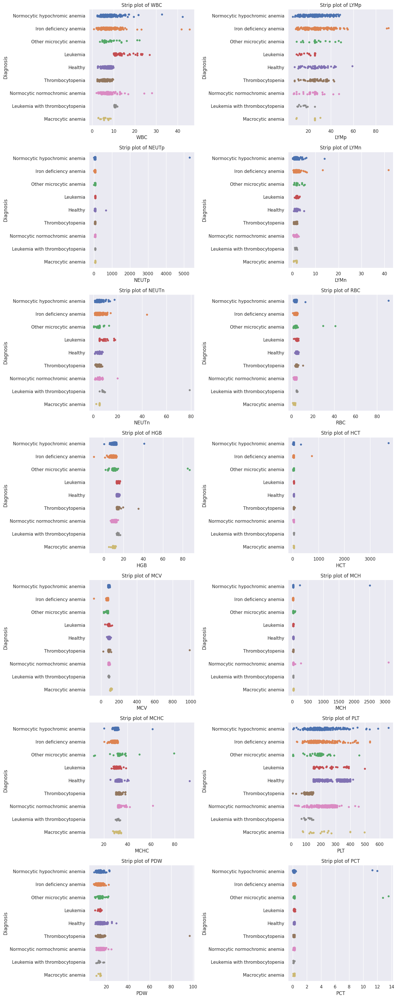

In [75]:
num_columns = len(db_features)

num_rows = (num_columns + 1) // 2 
num_cols = 2

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(14, 5 * num_rows))

axes = axes.flatten()

for i, col in enumerate(cbc_db.columns[:-1]):
    sns.stripplot(ax=axes[i], x=cbc_db[col], y=cbc_db['Diagnosis'], hue=cbc_db['Diagnosis'], legend=False,jitter=True)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Diagnosis')
    axes[i].set_title(f'Strip plot of {col}')

plt.tight_layout()
plt.show()

The dataset came with no missing values but if there were any missing values a KNN Imputer is used in the pipeline that would fill in missing values based on the closest similar ones in the dataset through KNearestNeigbors. 
Some entries have values that could only be typos such as negative values or values over 100 when they are supposed to be representating percentages so we will mark all of those as 'missing' and try to replace them as if they were missing instead with the KNN Imputer. 
Then we will drop the duplicates, and finally we will try to remove the outliers in such a way to preserve the values that are still possible while removing the impossible ones. To do this I mark all the values in a 0.005 percentile as NaN to modify with the KNN Imputer. This way all the impossible values are taken care of. We also do this to all negative values as those are also impossible. After that we set up the standardizer/normalizer to be used in the pipeline later for the classification techniques that require it. 

In [76]:
print("Dataset before modifying")
print(cbc_db.describe().T.round(3))

# Drops duplicate rows if there are any, and to clarify when I say duplicate I mean that all column values match another row exactly.
cbc_db.drop_duplicates(inplace=True,subset=cbc_db.columns.tolist())
print("Dataset after dropping duplicates")
print(cbc_db.describe().T.round(3))

# There are two negative values inputted, so this will replace them with a NaN to mark them so that they can be changed through KNearestNeighbors as if they were just missing instead.
numeric_cols = cbc_db.select_dtypes(include=['number']).columns
cbc_db[numeric_cols] = cbc_db[numeric_cols].where(cbc_db[numeric_cols] >= 0, pd.NA)

# Here we try to remove outliers. Key word being try as due to lack of detailed knowledge I cannot be too sure for which values are real outliers and which are just imprabable but still posssible.
# Some are obvious like values over 100 in the NEUTp category as going over 100% for something like this is obviously impossible, but otherwise I can only try to exclude possible outliers by replacing all values in the bottom and top 0.5 percentiles with NaN to immpute later.
# I chose 0.5 as the perctentile as it seemed to strike the best overall balance between removing outliers and preserving the seemingly rightfully high/low values of the dataset.
# Even then, it's hard to be sure if it's correct to apply this equally as some columns could be more correct or have no errors at all compared to others but without specialized knowledge this is the best I can do. 
def modify_outliers(df, lower_percentile=0.005, upper_percentile=0.995):
    numerical_cols = df.select_dtypes(include=['number']).columns

    lower_bounds = df[numerical_cols].quantile(lower_percentile)
    upper_bounds = df[numerical_cols].quantile(upper_percentile)

    def apply_bounds(col):
        return col.where((col >= lower_bounds[col.name]) & (col <= upper_bounds[col.name]), other=pd.NA)
    
    df[numerical_cols] = df[numerical_cols].apply(apply_bounds)
    return df

# Modify outliers to mark them as missing
cbc_db = modify_outliers(cbc_db)

print("Dataset after trying to modify outliers")
print(cbc_db.describe().T.round(3))

X = cbc_db.drop(columns=['Diagnosis'])

y = cbc_db['Diagnosis']

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)


# Used to standardize or normalize data in case of different data scale values to avoid bias when necessary as the numerical values some of the features can range from differ drastically from others.
numeric_pipeS = make_pipeline(StandardScaler())

numeric_pipeN = make_pipeline(MinMaxScaler())

# Used to fill in missing values
imputer = KNNImputer()

fullS = ColumnTransformer(
    transformers=[
        ("standardization", numeric_pipeS, db_features),
    ]
)

fullN = ColumnTransformer(
    transformers=[
        ("normalization", numeric_pipeN, db_features),
    ]
)


from sklearn.preprocessing import FunctionTransformer

def to_dataframe(X):
    return pd.DataFrame(X, columns=db_features)

Dataset before modifying
        count     mean      std    min      25%      50%      75%     max
WBC    1281.0    7.863    3.564   0.80    6.000    7.400    8.680    45.7
LYMp   1281.0   25.845    7.039   6.20   25.845   25.845   25.845    91.4
NEUTp  1281.0   77.511  147.746   0.70   71.100   77.511   77.511  5317.0
LYMn   1281.0    1.881    1.336   0.20    1.881    1.881    1.881    41.8
NEUTn  1281.0    5.141    2.872   0.50    5.100    5.141    5.141    79.0
RBC    1281.0    4.708    2.817   1.36    4.190    4.600    5.100    90.8
HGB    1281.0   12.185    3.813 -10.00   10.800   12.300   13.500    87.1
HCT    1281.0   46.153  104.886   2.00   39.200   46.153   46.153  3715.0
MCV    1281.0   85.794   27.178 -79.30   81.200   86.600   90.200   990.0
MCH    1281.0   32.085  111.171  10.90   25.500   27.800   29.600  3117.0
MCHC   1281.0   31.739    3.300  11.50   30.600   32.000   32.900    92.8
PLT    1281.0  229.981   93.019  10.00  157.000  213.000  293.000   660.0
PDW    1281.0

As we can see with the dataframe's description before any modifications, after dropping duplicates, and after modifiying the outliers we haeve 1217 samples with 15 having some sort of error or near impossible outlier in them to modify with the KNNImputer.
With the new data the strip plots appear much more reasonable now. Still, it's regrettable that I couldn't be more precise with my cleaning as I lack the knowledege to know which values were only improbable instead of impossible. But even if I did it isn't exactly efficient to manually do a different percentile expunging for each feature independantly as that isn't always reasonable when some datasets can have dozens of features. It just gets too time-consuming. 
As we can see from the value range that the features can run from for some machine learning techniques normalization or standardization will be necessary to avoid bias, the one I use depends on the technique it's being used for.

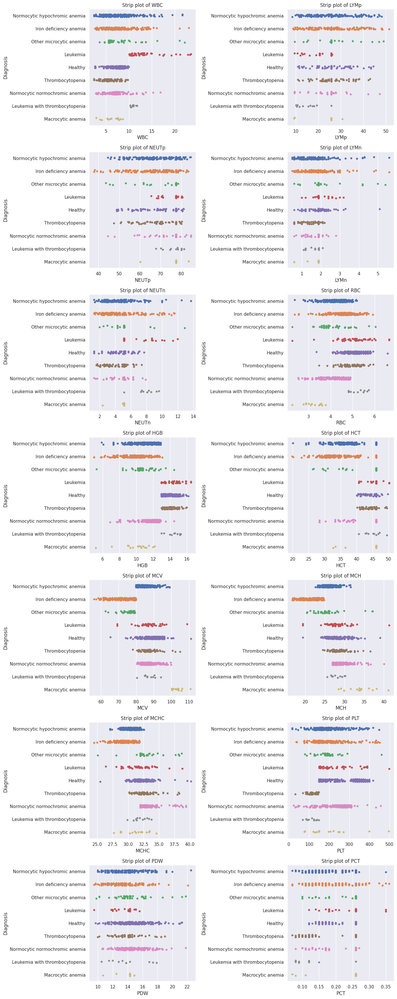

In [77]:
import matplotlib.pyplot as plt

num_rows = (num_columns + 1) // 2 
num_cols = 2

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(14, 5 * num_rows))

axes = axes.flatten()

for i, col in enumerate(cbc_db.columns[:-1]):
    sns.stripplot(ax=axes[i], x=cbc_db[col], y=cbc_db['Diagnosis'], hue=cbc_db['Diagnosis'], legend=False,jitter=True)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Diagnosis')
    axes[i].set_title(f'Strip plot of {col}')

plt.tight_layout()
plt.show()

Here is a histogram of each feature so that we can get a better idea of the distrubution of each feature more accurately. As we can see some features have much more skewed distributions than others with LYMp,NEUTp,LYMn,NeUTN,HCT,and PCT having over half of their samples occupy a small range of values while others are more evenly distributed such as RBC and HGB. PDW also has a majority of their samples in a small range with the only difference being that it isn't large enough to dominate over half of them.

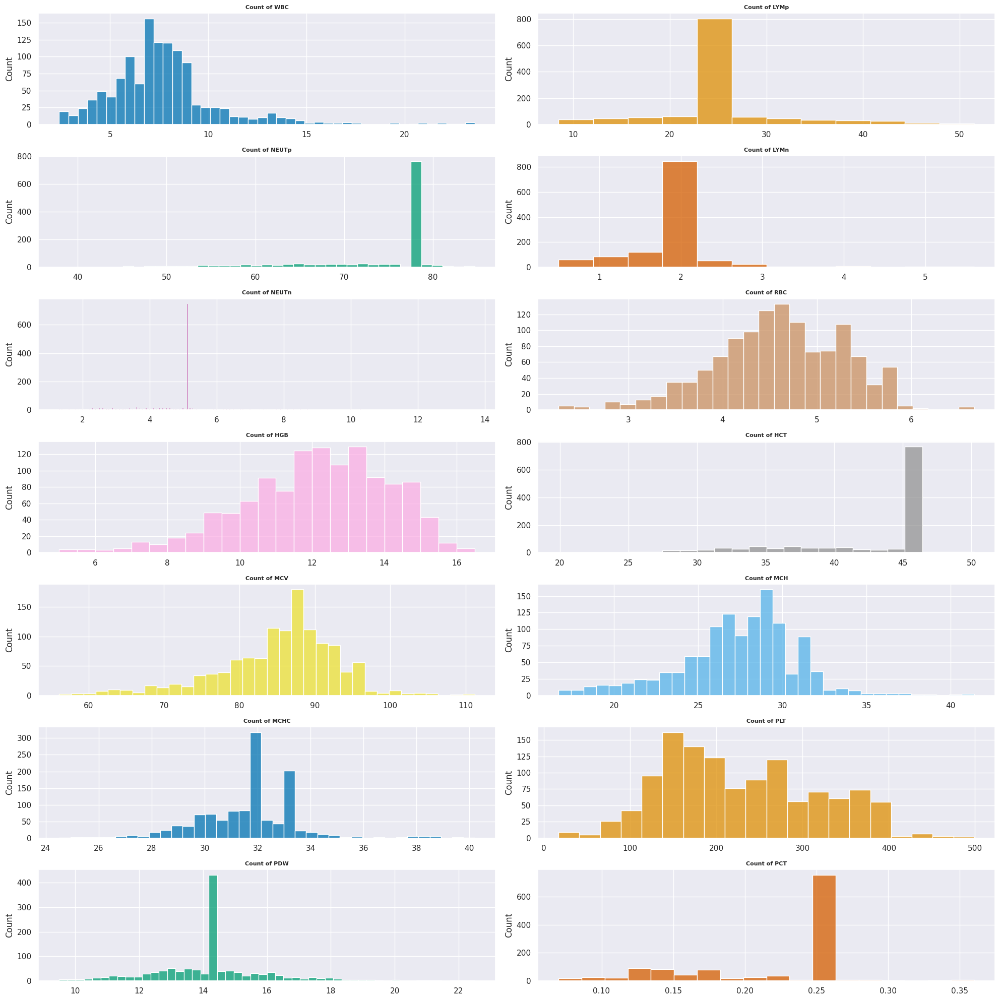

In [9]:
db_colors = sns.color_palette(palette = 'colorblind', n_colors = len(db_features))
fig,axs = plt.subplots(nrows = 7, ncols = 2, figsize = (20, 20))
axs = axs.flat

for i,feature in enumerate(db_features):
    sns.histplot(X, x = feature, fill = True, color = db_colors[i], ax = axs[i])
    axs[i].set_xlabel("")
    axs[i].set_title(f"Count of {feature}", fontsize=8, fontweight='bold')

fig.tight_layout()


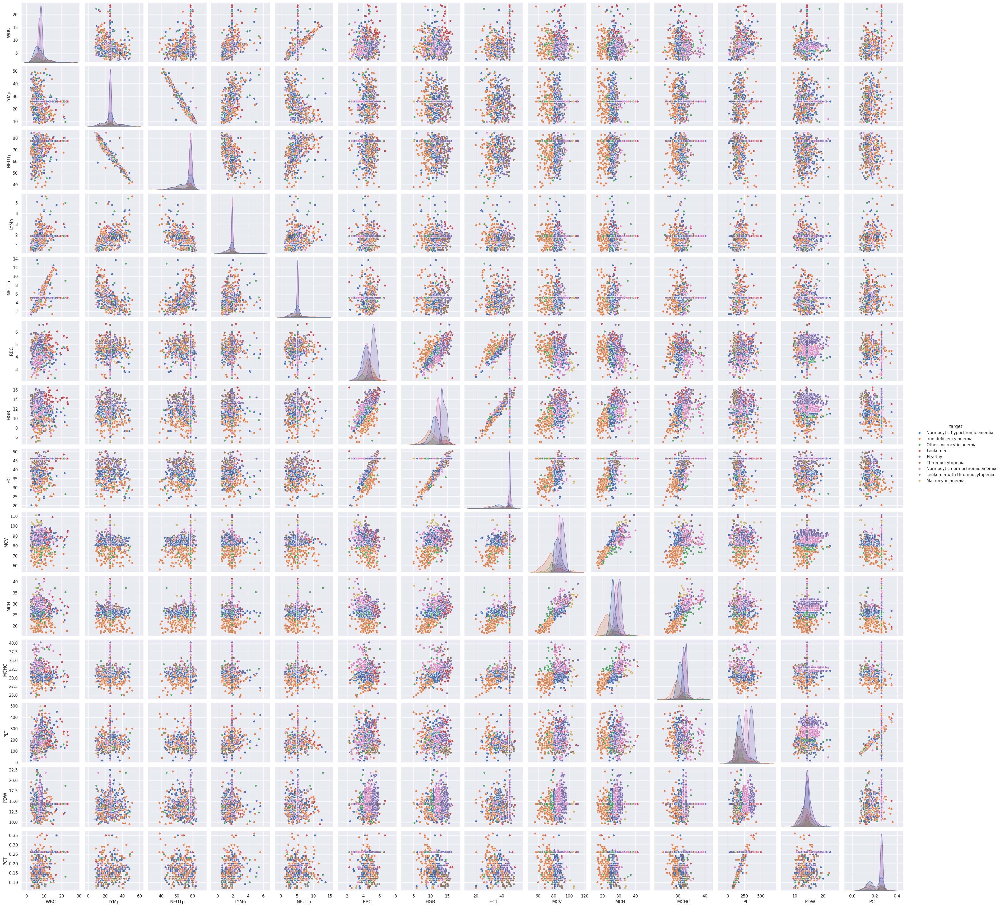

In [10]:
sns.pairplot(pd.concat([pd.DataFrame(X), pd.Series(y, name='target')], axis=1), hue='target')
plt.show()

It appears that some of the possible anemia types occupy a very small part of the dataset so we'll have to be sure to implement the cross validation in such a way that the results with little samples are included and trained off of properly. 

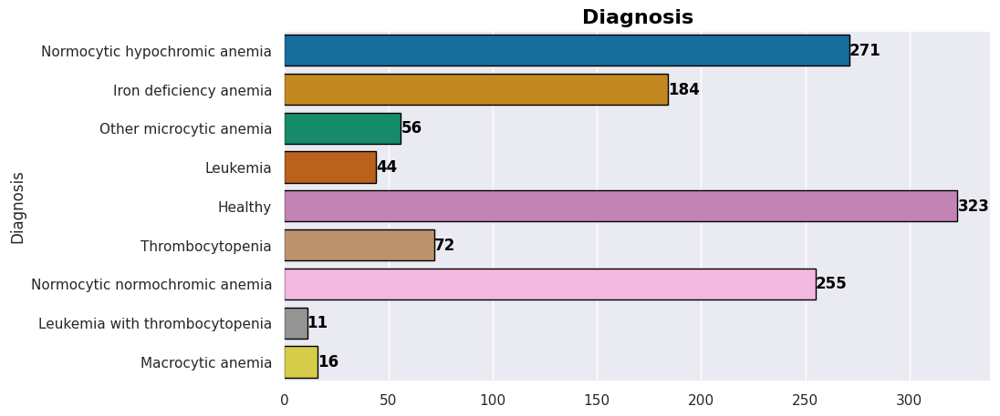

In [11]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.countplot(data=cbc_db, y='Diagnosis', hue='Diagnosis', palette='colorblind', edgecolor='black', dodge=False, legend=False)

for bar in ax.containers:
    ax.bar_label(bar, fontsize=12, fontweight='bold', color='black')

ax.set_xlabel("")
ax.set_title('Diagnosis', fontsize=16, fontweight='bold', color='black')
plt.show()

Here is a correlation matrix so we can attempt to identify any possible relationships between features. The method chosen is spearman as the data isn't necessarily normally distrubuted. For the most part the correlation between features is weak, but some have strong relationships. For example, the correlation between White Blood Cell count and Neutrophili count has a moderate positive monotonic relationship so as one value goes up so does the other with decent amount of correlation. Strong positive monotic relationships consist of Red Blood Cell count and Hemoglobin, Mean Corpuscular Hemoglobin Concentration and Mean Corpuscular Hemoglobin, Hematocrit and Platelet Crit, and the strongest of all being  the correlation between Mean Corpuscular Hemoglobin and Mean Corpuscular Volume. All of these sound accurate biologically speaking and thus make sense as to why there would be correlation between them. There are no strong negative monotic relationships with only a handful of moderate ones such as the one between Neutrophil Percentage and Lymphocyte Percentage which also makes sense as when one occupies a higher percentage of blood, the other must consequently go down.

Text(0.5, 1.0, 'Correlation Matrix')

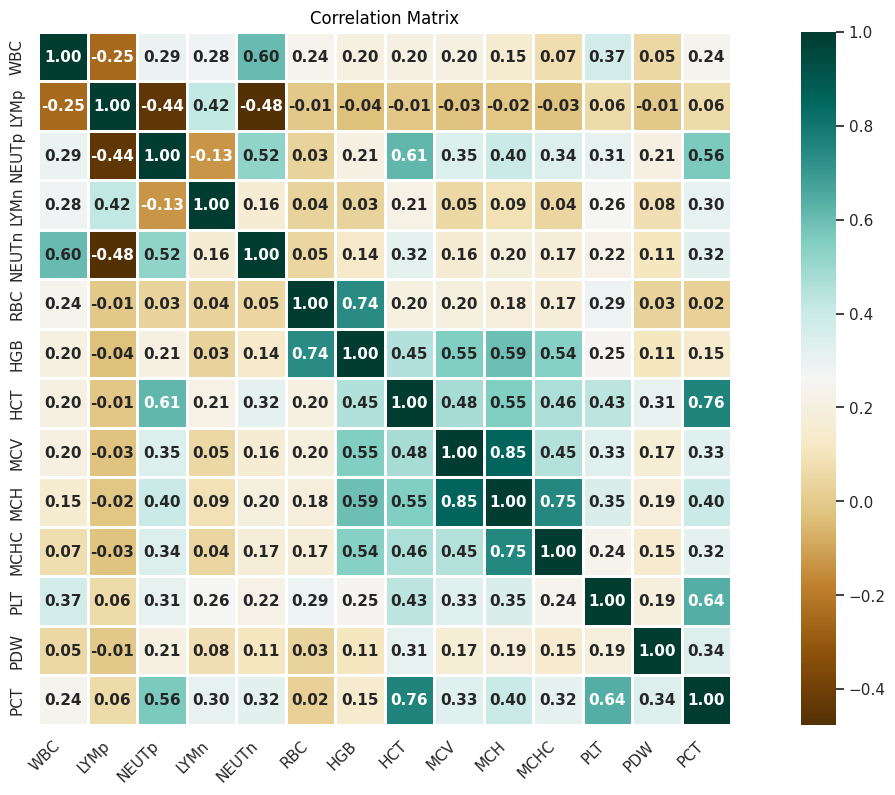

In [12]:
correlation_matrix = X[db_features].corr(method = 'spearman')
fig,ax = plt.subplots(figsize = (18,9))
sns.heatmap(correlation_matrix, 
            cmap = 'BrBG', 
            annot = True, 
            annot_kws = {'fontsize':11,'fontweight':'bold'},
            fmt = '.2f',
            linewidths = 1,
            square = True, 
            ax = ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = 'right')
ax.set_title("Correlation Matrix", fontsize = 12, color = 'black')

StratifiedKFold is chosen to preserve the percentage of samples for each class, with 10 splits being chosen as that is the gold standard of splits for more non-biased results. 

In [52]:
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=33)

In [152]:
pipeline_LGBM_GS = Pipeline(
    steps=[
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            LGBMClassifier(n_jobs=-1),
        ),
    ]
)
param_grid_LGBM = {
    'model__n_estimators': [100,250,500,750,1000],
    'model__learning_rate': [0.01,0.05,0.1,0.3],
    'model__max_depth': [1,3, 5,7],
    'model__min_child_weight': [1,3,5,7]
}

grid_search_LGBM = GridSearchCV(pipeline_LGBM_GS, param_grid=param_grid_LGBM, cv=kfold, scoring='f1_macro', return_train_score=True)

grid_search_LGBM.fit(X, y)

print("Best parameters found for LGBM Classifier:", grid_search_LGBM.best_params_)
print("Best F1-Score found for LGBM Classifier:", grid_search_LGBM.best_score_)

Best parameters found for LGBM Classifier: {'model__learning_rate': 0.05, 'model__max_depth': 3, 'model__min_child_weight': 1, 'model__n_estimators': 100}
Best F1-Score found for LGBM Classifier: 0.9275861138956787


In [153]:
pipeline_XGB_GS = Pipeline(
    steps=[
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            xgb.XGBClassifier(n_jobs=-1),
        ),
    ]
)

param_grid_XGB = {
    'model__n_estimators': [100,250,500,750,1000],
    'model__learning_rate': [0.01,0.05,0.1],
    'model__max_depth': [1,3,5,7,9,11],
    'model__min_child_weight': [1,3,5,7]
}

grid_search_XGB = GridSearchCV(pipeline_XGB_GS, param_grid=param_grid_XGB, cv=kfold, scoring='f1_macro', return_train_score=True)

grid_search_XGB.fit(X, y_encoded)

print("Best parameters found for XGB Classifier:", grid_search_XGB.best_params_)
print("Best F1-Score found for XGB Classifier:", grid_search_XGB.best_score_)

Best parameters found for XGB Classifier: {'model__learning_rate': 0.01, 'model__max_depth': 7, 'model__min_child_weight': 1, 'model__n_estimators': 250}
Best F1-Score found for XGB Classifier: 0.9339347289799717


In [261]:
pipeline_DTC_GS = Pipeline(
    steps=[
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            DecisionTreeClassifier(random_state = 33),
        ),
    ]
)

param_grid_DTC = {
    'model__max_depth': [1,2,3,4,5,6,7],
    'model__min_samples_split': [2,3,4,5,6,7,9,10,11,12,13],
    'model__min_samples_leaf': [1,2,3,4,5]
}

grid_search_DTC = GridSearchCV(estimator=pipeline_DTC_GS, param_grid=param_grid_DTC, cv=kfold, scoring='f1_macro')

grid_search_DTC.fit(X, y)

print("Best parameters found for Decision Tree:", grid_search_DTC.best_params_)
print("Best F1-Score found for Decision Tree:", grid_search_DTC.best_score_)

Best parameters found for Decision Tree: {'model__max_depth': 5, 'model__min_samples_leaf': 4, 'model__min_samples_split': 2}
Best F1-Score found for Decision Tree: 0.9375631063943981


In [194]:
#Normalizer
pipeline_Normalized_SVC_GS = Pipeline(
    steps=[
        ("preprocess", fullN),
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            SVC(),
        ),
    ]
)

param_grid_SVC = {
    'model__C':np.logspace(-5, 5, 10, base=2),
    'model__gamma':np.logspace(5, 5, 10, base=2),
    "model__kernel":["poly"],
    "model__degree":[1,2,3,4,5],
}

grid_search_SVC = GridSearchCV(estimator=pipeline_Normalized_SVC_GS,param_grid=param_grid_SVC,  scoring="f1_macro", cv=kfold  )

grid_search_SVC.fit(X, y)

print("Best parameters found for SVC:", grid_search_SVC.best_params_)
print("Best F1-Score found for SVC:", grid_search_SVC.best_score_)

Best parameters found for SVC: {'model__C': 14.81399539659665, 'model__degree': 1, 'model__gamma': 32.0, 'model__kernel': 'poly'}
Best F1-Score found for SVC: 0.8306015389636967


In [263]:
#Normalizer
pipeline_Normalized_KNN_GS = Pipeline(
    steps=[
        ("preprocess", fullN),
        ("imputer", imputer),
        ("to_df", FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            KNeighborsClassifier(n_jobs=-1),
        ),
    ]
)

param_grid_KNN = {
    "model__n_neighbors": [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30],  
    "model__weights":["distance","uniform"],
    "model__leaf_size": [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30],  
}

grid_search_KNN = GridSearchCV(estimator=pipeline_Normalized_KNN_GS, param_grid=param_grid_KNN,  scoring="f1_macro", cv=kfold)

grid_search_KNN.fit(X, y)

print("Best parameters found for KNeighbors:", grid_search_KNN.best_params_)
print("Best F1-Score found for KNeighbors:", grid_search_KNN.best_score_)

Best parameters found for KNeighbors: {'model__leaf_size': 1, 'model__n_neighbors': 2, 'model__weights': 'uniform'}
Best F1-Score found for KNeighbors: 0.6903653300347443


In [197]:
#Standardizer
pipeline_Standardized_LR_GS = Pipeline(
    steps=[
        ("preprocess", fullS),
        ("imputer", imputer),
        ("to_df", FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            LogisticRegression(solver='newton-cg',random_state=34, multi_class="auto", n_jobs=-1,max_iter=1000000),
        ),
    ]
)

param_grid_LR = {
    "model__C": np.logspace(0, 8, 30, base=2),
}

grid_search_LR = GridSearchCV(estimator=pipeline_Standardized_LR_GS, param_grid=param_grid_LR,  scoring="f1_macro", cv=kfold )

grid_search_LR.fit(X, y)

print("Best parameters found for Logistic Regression:", grid_search_LR.best_params_)
print("Best F1-Score found for Logistic Regression:", grid_search_LR.best_score_)

Best parameters found for Logistic Regression: {'model__C': 17.605216143126537}
Best F1-Score found for Logistic Regression: 0.803655082279769


In [14]:
pipeline_LGBM = Pipeline(
    steps=[
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            LGBMClassifier(n_estimators=100,learning_rate=0.05,max_depth=3,min_child_weight=1,n_jobs=-1),
        ),
    ]
)
result_LGBM = cross_validate(pipeline_LGBM, X, y, cv=kfold, scoring='f1_macro',return_estimator=True)

accuracies_LGBM = result_LGBM['test_score']

best_index_LGBM = np.argmax(accuracies_LGBM)
best_accuracy_LGBM = accuracies_LGBM[best_index_LGBM]
best_estimator_LGBM = result_LGBM['estimator'][best_index_LGBM]

print("LGBM Classifier Best F1-Score:", round(best_accuracy_LGBM, 5))

y_pred_LGBM = best_estimator_LGBM.predict(X)

print(classification_report(y, y_pred_LGBM))

best_model_LGBM = best_estimator_LGBM.named_steps['model']
feature_importances = best_model_LGBM.feature_importances_

importance_df = pd.DataFrame({'Feature': db_features, 'Importance': feature_importances})

importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)

LGBM Classifier Best F1-Score: 1.0
                                precision    recall  f1-score   support

                       Healthy       1.00      1.00      1.00       323
        Iron deficiency anemia       1.00      1.00      1.00       184
                      Leukemia       1.00      1.00      1.00        44
Leukemia with thrombocytopenia       1.00      1.00      1.00        11
             Macrocytic anemia       1.00      1.00      1.00        16
 Normocytic hypochromic anemia       1.00      1.00      1.00       271
Normocytic normochromic anemia       1.00      1.00      1.00       255
       Other microcytic anemia       1.00      1.00      1.00        56
              Thrombocytopenia       1.00      1.00      1.00        72

                      accuracy                           1.00      1232
                     macro avg       1.00      1.00      1.00      1232
                  weighted avg       1.00      1.00      1.00      1232

   Feature  Importance
8  

In [15]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)


pipeline_XGB = Pipeline(
    steps=[
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            xgb.XGBClassifier(n_estimators=250,learning_rate=0.01,max_depth=7,min_child_weight=1,n_jobs=-1),
        ),
    ]
)


result_XGB = cross_validate(pipeline_XGB, X, y_encoded, cv=kfold, scoring='f1_macro',return_estimator=True)

accuracies_XGB = result_XGB['test_score']

best_index_XGB = np.argmax(accuracies_XGB)
best_accuracy_XGB = accuracies_XGB[best_index_XGB]
best_estimator_XGB = result_XGB['estimator'][best_index_XGB]

print("XGB Classifier Best F1-Score:", round(best_accuracy_XGB, 5))

y_pred = best_estimator_XGB.predict(X)
y_pred_encoded = label_encoder.fit_transform(y_pred)

print(classification_report(y_encoded, y_pred_encoded))


best_model_XGB = best_estimator_XGB.named_steps['model']
feature_importances = best_model_XGB.feature_importances_

importance_df = pd.DataFrame({'Feature': db_features, 'Importance': feature_importances})

importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)

XGB Classifier Best F1-Score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       323
           1       0.98      1.00      0.99       184
           2       1.00      1.00      1.00        44
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00        16
           5       0.99      1.00      1.00       271
           6       1.00      1.00      1.00       255
           7       1.00      0.95      0.97        56
           8       1.00      0.97      0.99        72

    accuracy                           1.00      1232
   macro avg       1.00      0.99      0.99      1232
weighted avg       1.00      1.00      1.00      1232

   Feature  Importance
6      HGB    0.266589
10    MCHC    0.193497
8      MCV    0.148379
11     PLT    0.128440
9      MCH    0.118032
0      WBC    0.071877
7      HCT    0.017230
4    NEUTn    0.015058
13     PCT    0.010652
5      RBC    0.007928
2    NEU

In [16]:
pipeline_DTC = Pipeline(
    steps=[
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            DecisionTreeClassifier(random_state = 33,max_depth=5,min_samples_leaf=4,min_samples_split=2),
        ),
    ]
)

result_DTC = cross_validate(pipeline_DTC, X, y, cv=kfold, scoring='f1_macro',return_estimator=True)

accuracies_DTC = result_DTC['test_score']

best_index_DTC = np.argmax(accuracies_DTC)
best_accuracy_DTC = accuracies_DTC[best_index_DTC]
best_estimator_DTC = result_DTC['estimator'][best_index_DTC]

print("Decision Tree Best F1-Score:", round(best_accuracy_DTC, 5))

y_pred_DTC = best_estimator_DTC.predict(X)
print(classification_report(y, y_pred_DTC))


best_model_DTC = best_estimator_DTC.named_steps['model']
feature_importances = best_model_DTC.feature_importances_

importance_df = pd.DataFrame({'Feature': db_features, 'Importance': feature_importances})

importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)

Decision Tree Best F1-Score: 1.0
                                precision    recall  f1-score   support

                       Healthy       1.00      1.00      1.00       323
        Iron deficiency anemia       0.98      0.99      0.98       184
                      Leukemia       0.98      1.00      0.99        44
Leukemia with thrombocytopenia       0.79      1.00      0.88        11
             Macrocytic anemia       0.88      0.94      0.91        16
 Normocytic hypochromic anemia       0.98      1.00      0.99       271
Normocytic normochromic anemia       0.99      0.98      0.99       255
       Other microcytic anemia       1.00      0.84      0.91        56
              Thrombocytopenia       0.99      0.97      0.98        72

                      accuracy                           0.98      1232
                     macro avg       0.95      0.97      0.96      1232
                  weighted avg       0.99      0.98      0.98      1232

   Feature  Importance
8    

In [17]:
pipeline_Normalized_SVC = Pipeline(
    steps=[
        ("preprocess", fullN),
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            SVC(max_iter=1000000,C=14.81399539659665,degree=1,gamma=32,kernel='poly'),
        ),
    ]
)

result_SVC = cross_validate(pipeline_Normalized_SVC, X, y, cv=kfold, scoring='f1_macro',return_estimator=True)


accuracies_SVC = result_SVC['test_score']

best_index_SVC = np.argmax(accuracies_SVC)
best_accuracy_SVC = accuracies_SVC[best_index_SVC]
best_estimator_SVC = result_SVC['estimator'][best_index_SVC]

print("SVC Best F1-Score:", round(best_accuracy_SVC, 5))

y_pred_SVC = best_estimator_SVC.predict(X)

print(classification_report(y, y_pred_SVC))

SVC Best F1-Score: 0.92438
                                precision    recall  f1-score   support

                       Healthy       0.97      0.99      0.98       323
        Iron deficiency anemia       0.97      0.99      0.98       184
                      Leukemia       1.00      0.98      0.99        44
Leukemia with thrombocytopenia       1.00      1.00      1.00        11
             Macrocytic anemia       1.00      1.00      1.00        16
 Normocytic hypochromic anemia       0.98      0.96      0.97       271
Normocytic normochromic anemia       0.96      0.98      0.97       255
       Other microcytic anemia       1.00      0.93      0.96        56
              Thrombocytopenia       0.98      0.86      0.92        72

                      accuracy                           0.97      1232
                     macro avg       0.98      0.97      0.97      1232
                  weighted avg       0.97      0.97      0.97      1232



In [18]:
pipeline_Normalized_KN = Pipeline(
    steps=[
        ("preprocess", fullN),
        ('imputer', imputer),
        ('to_df', FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            KNeighborsClassifier(n_neighbors=2,leaf_size=1,weights='uniform',n_jobs=-1),
        ),
    ]
)

result_KN = cross_validate(pipeline_Normalized_KN, X, y, cv=kfold, scoring='f1_macro',return_estimator=True)

accuracies_KN = result_KN['test_score']

best_index_KN = np.argmax(accuracies_KN)
best_accuracy_KN = accuracies_KN[best_index_KN]
best_estimator_KN = result_KN['estimator'][best_index_KN]

print("KNeighbors Best F1-Score:", round(best_accuracy_KN, 5))

y_pred_KN = best_estimator_KN.predict(X)
print(classification_report(y, y_pred_KN))

KNeighbors Best F1-Score: 0.80468
                                precision    recall  f1-score   support

                       Healthy       0.88      1.00      0.93       323
        Iron deficiency anemia       0.88      0.99      0.93       184
                      Leukemia       0.82      0.75      0.79        44
Leukemia with thrombocytopenia       0.78      0.64      0.70        11
             Macrocytic anemia       0.89      1.00      0.94        16
 Normocytic hypochromic anemia       0.88      0.87      0.88       271
Normocytic normochromic anemia       0.94      0.90      0.92       255
       Other microcytic anemia       1.00      0.55      0.71        56
              Thrombocytopenia       0.98      0.65      0.78        72

                      accuracy                           0.90      1232
                     macro avg       0.89      0.82      0.84      1232
                  weighted avg       0.90      0.90      0.89      1232



In [19]:
pipeline_Standardized_LR = Pipeline(
    steps=[
        ("preprocess", fullS),
        ("imputer", imputer),
        ("to_df", FunctionTransformer(to_dataframe, validate=False)),
        (
            "model",
            LogisticRegression(solver='newton-cg',max_iter=1000000,random_state=34, multi_class="auto", C=17.605216143126537,n_jobs=-1),
        ),
    ]
)

result_LR = cross_validate(pipeline_Standardized_LR, X, y, cv=kfold, scoring='f1_macro',return_estimator=True)


accuracies_LR = result_LR['test_score']

best_index_LR = np.argmax(accuracies_LR)
best_accuracy_LR = accuracies_LR[best_index_LR]
best_estimator_LR = result_LR['estimator'][best_index_LR]

print("Logistic Regression Best F1-Score:", round(best_accuracy_LR, 5))

y_pred_LR = best_estimator_LR.predict(X)
print(classification_report(y, y_pred_LR))


Logistic Regression Best F1-Score: 0.9334
                                precision    recall  f1-score   support

                       Healthy       0.94      0.95      0.94       323
        Iron deficiency anemia       0.97      0.96      0.96       184
                      Leukemia       0.91      0.91      0.91        44
Leukemia with thrombocytopenia       1.00      1.00      1.00        11
             Macrocytic anemia       0.88      0.88      0.88        16
 Normocytic hypochromic anemia       0.93      0.93      0.93       271
Normocytic normochromic anemia       0.93      0.96      0.95       255
       Other microcytic anemia       0.92      0.88      0.90        56
              Thrombocytopenia       0.87      0.82      0.84        72

                      accuracy                           0.93      1232
                     macro avg       0.93      0.92      0.92      1232
                  weighted avg       0.93      0.93      0.93      1232



In [34]:
pipelines={
    "LGBM Classifier":pipeline_LGBM,
    "XGB Classifier":pipeline_XGB,
    "Decision Tree Classifier":pipeline_DTC,
    "SVC":pipeline_Normalized_SVC,
    "KNeighbors":pipeline_Normalized_KN,
    "Logistic Regression":pipeline_Standardized_LR,
}
results={}
resultsEst={}
for name, pipeline in pipelines.items():
    result = cross_validate(pipeline, X, y_encoded, cv=kfold, scoring='f1_macro', return_train_score=True, return_estimator=True)
    results[name] = result['test_score']
    resultsEst[name]=result['estimator'][0]

results_df = pd.DataFrame(results)


These are the final results I obtained using these 6 different algorithms, with all of them being scored according to Macro F1 as if it is diagnosis something medically in a patient it is best that one strives to reduce false positives and negatives as much as possible, and equally at that so that all of the correct dignoses should be equally weighed in terms of importance despite the imbalance present in the dataset, thus Macro F1. 

Ultimately, the three with the best results were LGBM classifier followed by XGB classifier and then Decision Tree Classifier. Behind them is Logistic Regression and SVC and the worst by a good margin is KNeighbors. While the other 5 are have a difference of 7% at most from the comparing the best to the worst, KNeighbors is almost twice as much worse then that when compared to the 2nd worst. As for why KNeighbors performs so poorly I'd assume that it has to do with the high dimensionality of the dataset with 14 different features so the distance it uses to judge what the correct result is may be less and less meaningful. To add on to that the data distribution may be too complex/non-linear for KNeighbors also despite the data being normalized before getting processed. And as shown a bit farther down, it also has some of the worst overfitting when it comes to the training data with all of this adding up to a reasonable explanation for why its results are poor. Logistic Regression still performs well, but not as well as it could be due to the non-linearity of the class boundaries. SVC handles it better with the kernel "poly" but it still isn't as effective as the decision tree and ensemble methods due to how complicated the patterns involved are. Due to how they work, the decision tree easily handles the non-linear relationships in the data by creating complex decision boundaries, and the ensemble methods are even more so effective due to how they combine multiple trees to improve performence resulting in them all perform extremely well with their best fold, with LGBM being the only one to have a fold where it got all 1.00 f1-scores as well having a macro avg of 1.00.

In [21]:
summary_stats = results_df.describe().transpose()
print(summary_stats)

                          count      mean       std       min       25%  \
LGBM Classifier            10.0  0.927586  0.067072  0.809100  0.878867   
XGB Classifier             10.0  0.933935  0.057076  0.826686  0.901867   
Decision Tree Classifier   10.0  0.937563  0.058873  0.819304  0.927949   
SVC                        10.0  0.830602  0.077473  0.658232  0.808839   
KNeighbors                 10.0  0.690365  0.094067  0.530420  0.657916   
Logistic Regression        10.0  0.803655  0.082546  0.634582  0.756496   

                               50%       75%       max  
LGBM Classifier           0.947631  0.975361  1.000000  
XGB Classifier            0.951755  0.965899  1.000000  
Decision Tree Classifier  0.956550  0.975414  1.000000  
SVC                       0.826865  0.882213  0.924381  
KNeighbors                0.712239  0.744952  0.804681  
Logistic Regression       0.816093  0.853478  0.933396  


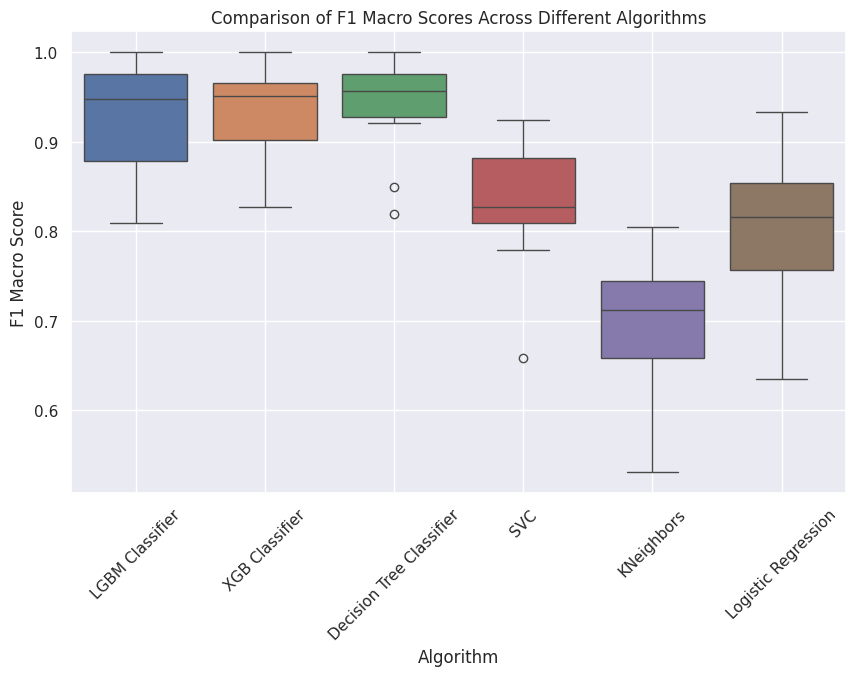

In [268]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=results_df)
plt.title('Comparison of F1 Macro Scores Across Different Algorithms')
plt.ylabel('F1 Macro Score')
plt.xlabel('Algorithm')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Here we can see the best folds for each algorithm and their hits/misses directly. LGBM has only 3 misses, XGB has 9, Decision Tree has 21, SVC has 41, KNeighbors has 115, and Logistic Regression has 81, all of which help illustrate their respective accurracies and inaccuracies that resulted in their respective F1-Scores. 

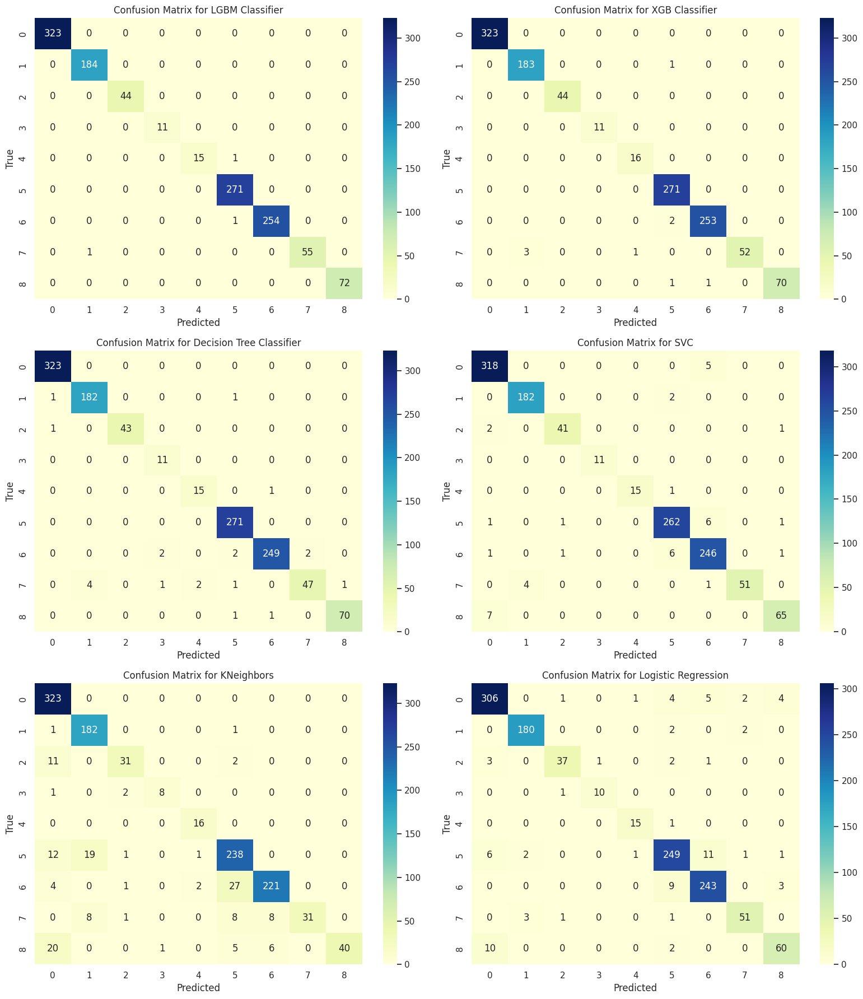

In [47]:
def plot_confusion_matrix(ax, y_true, y_pred, title, classes):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu', xticklabels=classes, yticklabels=classes, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows))

for i, (name, estimator) in enumerate(resultsEst.items()):
    y_pred = estimator.predict(X)
    y_pred_encoded = label_encoder.transform(y_pred)

    row, col = divmod(i, n_cols)
    ax = axes[row, col] if n_rows > 1 else axes[col]
    plot_confusion_matrix(ax, y_encoded, y_pred_encoded, f'Confusion Matrix for {name}', label_encoder.classes_)

# Remove empty subplots
if len(pipelines) % n_cols != 0:
    for j in range(len(pipelines) % n_cols, n_cols):
        fig.delaxes(axes[n_rows - 1, j] if n_rows > 1 else axes[j])

plt.tight_layout()
plt.show()

Here we can compare the training score vs the cross-validation score. At the largest training size the decision tree's CV score is very close to the training score indicitating that it's well balanced. The LGBM and XGB classifier's are more overfitted then the decision tree, but they still have good F1 scores. The other three suffer more heavily from overfitting with KNeighbors suffering the most due to the training score not being as high as the others to begin with. 

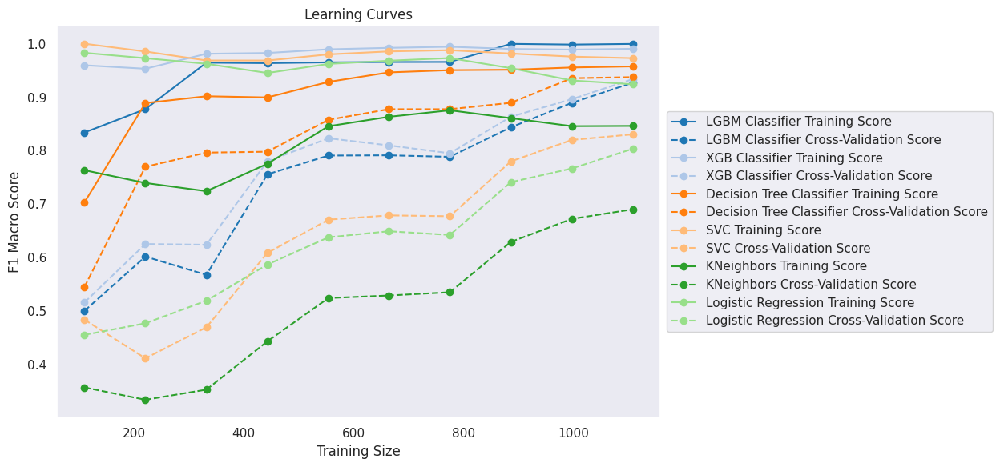

In [38]:
from sklearn.model_selection import learning_curve
plt.figure(figsize=(10, 6))

colors = sns.color_palette("tab20", len(pipelines)) 

for (name, pipeline), color in zip(pipelines.items(), colors):
    train_sizes, train_scores, test_scores = learning_curve(pipeline, X, y_encoded, cv=kfold, scoring='f1_macro', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
    
    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    
    plt.plot(train_sizes, train_scores_mean, 'o-', label=f'{name} Training Score', color=color)
    plt.plot(train_sizes, test_scores_mean, 'o--', label=f'{name} Cross-Validation Score', color=color)

plt.title('Learning Curves')
plt.xlabel('Training Size')
plt.ylabel('F1 Macro Score')
plt.tight_layout(rect=[0, 0, 0.85, 1])

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.grid()
plt.show()

Here we have feature importances for LGBM,XGB,and Decision Tree since they have it built in. They have distinct differences between the other with XGB and Decision Treeo having 6 features with an importance greater than 0.05 compared to LGBM having 7 features above 0.09.
And very different feature importances are placed on several of those features such as LGBM and Decision Tree having MCV as the most important while XGB has it as only the third most. XGB and Decision Tree place a good deal more importance on MCHC compared to LGBM. LGBM is the only one to place any real weight on RBC compared to the other two, a noticeable difference when considers how important RBC normally is in the context of anemia. The Decision Tree Classifier also doesn't attempt to use all of the features for its predictions unlike the other two who place at least 1% worth of value on each feature minimum.

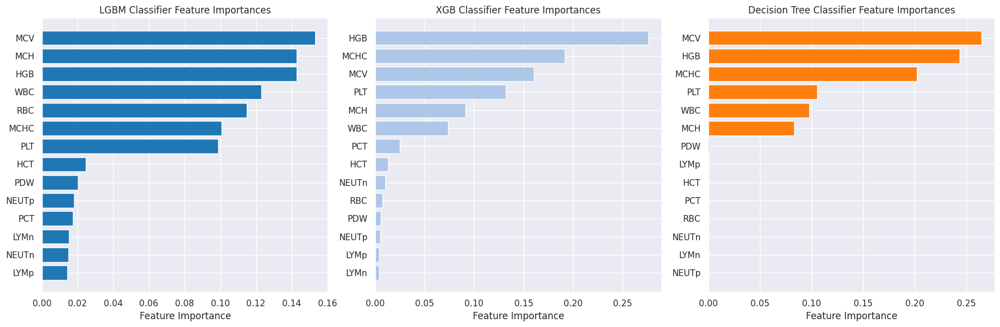

In [48]:
feature_importance_classifiers = ["LGBM Classifier", "XGB Classifier", "Decision Tree Classifier"]

fig, axes = plt.subplots(1, len(feature_importance_classifiers), figsize=(18, 6))

for i, name in enumerate(feature_importance_classifiers):
    best_estimator = resultsEst[name]
    feature_importances = best_estimator.named_steps['model'].feature_importances_
    
    if np.sum(feature_importances) != 1.0: 
        feature_importances = feature_importances / np.sum(feature_importances) 
    
    sorted_idx = np.argsort(feature_importances)
    sorted_feature_importances = feature_importances[sorted_idx]
    sorted_features = np.array(db_features)[sorted_idx]
    
    axes[i].barh(range(len(sorted_feature_importances)), sorted_feature_importances, align='center', color=colors[i])
    axes[i].set_yticks(range(len(sorted_feature_importances)))
    axes[i].set_yticklabels(sorted_features)
    axes[i].set_xlabel('Feature Importance')
    axes[i].set_title(f'{name} Feature Importances')

plt.tight_layout()
plt.show()

Ultimately the best algorithm for this was LGBM Classifier, possibly in part due to how it tries to use all features as well as how the trees in it grow leaf-wise compared to trees growing depth-wise in XGB. Still, they are very close in score along with the Decision Tree Classifier with  SVC and Logistic Regression a bit further behind and KNeighbors very far behind in last place. These results let me learn a lot about the pros and cons of some of these algorithms in terms of what they are good and not good at, especially in the case of Kneighbors. When there are too many features it's probably best just to not try and use it at all due to how its main method becomes less useful, and that goes double if it's all nonlinear also. If the features and their relationships aren't linear enough it's also best to not try and use Logistic Regression also, and as for SVC it depends on if one of its kernels fits the data well enough. They both still performed fine, but when going for the highest possible scores according to the metric they wouldn't be something I pick again for cases such as this. Decision Tree and the ensemble methods just work too well for scenarios such as this for others to really compete. 

It was also surprising to me to see that in this case the Decision Tree Classifier without any ensemble methods was still close with the ensemble ones. The ensemble methods do give barely better results, but if I was forced to run through a large possible amount of values to find the optimal parameters for each I would seriously consider just sticking with the Decision Tree due to how much faster the grid search for parameters took for it compared to the other two, but it would probably be best that next time I just use RandomizedGridSearch or the experimental HalfGridSearch and tinker with them a bit to find the near optimal values in a lot less time depending on how strict I was trying to be with finding the optimal parameters. If it cut down on the number of algorithms I was looking at I would also look into expanding the number and types of parameters I plug into the grid search to really see how much I can optimize themm, albeit at that point using Randomized or Half Grid Search would be all but required due to how long it would take otherwise. I would also examine the histogram for each feature more closely and try to eliminate prospective algorithms right off the bat based on how the data is distributed and how linear/non-linear it appears to be to save myself time from considering unoptimal choices. I would also think about trying to optimize the number of folds I test with instead of using the standard 10. And another thing to try is feature selection, especially when there's feature importances such as the Decision Tree Classifier's where it only uses half of the features at all so there's little reason to use the rest for that case in particular. But of course when factoring all of this together the time spent optimizing the parameters and such swells up drastically so I would reallistically only try and do all of this for 2-3 algorithms at most, and definitely with RandomizedGridSearch or HalfGridSearch to find something close to best even if not necessarily the best due to how much time might be spend searching otherwise. Another thing I would consider in the future is possibly setting up a more refined outlier detection/marking process for each feature instead of the one size fits all approach I took so that by taking out impossible outliers in one feature I don't risk taking the improbable but still possible outliers in another, of course I would probably want to also do this in a way by somehow manually checking to see what the actual limits are for each feature itself which may not also be possible but it would still be more accurate than what I currently have implemented. 